<center> <h2> Predicting Popularity in Music</h2> </center>

<center><h4>Amir Bagheri, Jack Denson, Elijah Cobb</h4></center>

<hr style="height:2px; border:none; color:black; background-color:black;">

# Executive Summary
Music from streaming platforms has become a very important part of daily lives in recent years, and opened the door for Data Science research. We seek to expand on this research by seeing if we can reliably predict music popularity from its features. We will use the Spotify dataset, and simplify it down to what we determine are the most important features for popularity. We will then visualize the data, plotting these features against each other and against song popularity to see if we can see any patterns within them. Finally, we will run hypothesis tests to see which features are correlated with popularity, and build machine learning models to try to predict popularity. We offer two approaches: our first approach, regression seeks to determine the actual popularity score, while our secondary apporach, classification, seeks to determine whether a song's popularity is above a given threshold. We then conclude our research with some final thoughts and results.

<hr style="height:2px; border:none; color:black; background-color:black;">

## Outline
1. <a href='#1'>INTRODUCTION</a>
2. <a href='#2'>METHOD</a>
3. <a href='#3'>RESULTS</a>
4. <a href='#4'>DISCUSSION</a>

<a id="1"></a>
<hr style="height:2px; border:none; color:black; background-color:black;">

## 1. INTRODUCTION

### 1.1. Problem Statement
     
The predominant objective of this project is to determine how the characteristics of a piece of music influence its potential for popularity, and secondly, how these characteristics influence each other. These characteristics include attributes not constrained to a song's acoustic and audio features: For instance, while our models utilize information such as acousticness and danceability, the release date and duration of a song are also taken into consideration. From visualizations of the data as well as the use of our predictive models, one can determine if these attributes have a significant bearing in the resulting popularity of a song, or other attributes. The models of this project solely use supervised machine learning, with both regression and classification algorithms being evaluated. 

### 1.2: Significance of the Problem
     
Throughout all of human history, music has continuously been one of the most crucial and powerful components of virtually all human cultures. Especially prevalent in recent history, the universal desire to enjoy music has been responded with industries providing services for the general public to access it, making music a larger and more accessible part of life every new decade. Now, streaming services such as Spotify and Apple Music have made music more accessible than it has ever been, being the current dominating force in an industry previously ruled by predecessors such as downloaded MP3's, CD's, casettes, vinyl records, etc. In 2019, streaming revenue grew by 22.9% to 11.4 billion USD and for the first time accounted for more than half (56.1%) of global recorded music revenue. [3]

Due to this widespread and frequent use of music related digital services, the ability to make accurate predictions of song popularity not only has the potential to benefit musicians and companies in the industry, but also to all the consumers. For instance, a model that is exceptional at predicting popular songs can also be used to predict popular songs for smaller populations with more specific tastes, improving the functionality of personalized musical suggestions based off a user's musical preferences. Furthermore, establishing connections and relationships between musical attributes by seeing how they influence one another can provide a deeper understanding of the general mechanics and trends of music itself.

### 1.3: Related Work

Unsurprisingly, due to machine learning's very high potential for utility and benefit in the music industry, a great deal of research has been invested in the topic of predicting song popularity, sometimes referred to as "Hit Song Science". See below for brief summaries of three relevant studies on predicting song popularity:

1. In the experimental study [6] conducted by researchers Dodds, Salganik, and Dodds, they created an artificial music market where participants downloaded previously unknown songs either with or without the knowledge of previous partipants' choices. They found that the increased social influence involved in knowing what previous participants selected significantly increased both inequality and unpredictability of success. They also found that song quality only partially played a role in success: the songs rated lowest quality rarely did well, and the songs of highest quality rarely did poorly, but any result in between was practically equally possible. 


2. Similar to how the previous study incorporated social influence, the work of researchers Koenignstein, Zilberman, and Shavitt [4], predicted a song's Billboard success based on assessing the activity of peer-to-peer networks, which are the leading cause of music piracy but are also used for music sampling prior to purchase. Both regression and classification algorithms were used in this study. First, using regression, they calculated a strong positive correlation of .67 between a song's frequency of P2P queries and Billboard Digital Songs ranking success, proving that P2P downloads and music sales are closely tied together. They then show how this correlation can be utilized by common classification algorithms to predict a song's success in the Billboard Digital Songs chart in advance. Using decision tree classification, the classifier simply predicted whether or not a song will reach a top ten ranking with an accuracy of 73.5%.


3. Furthermore, François Pachet, composer and director of the Spotify Creator Technology Research Lab, and Pierre Roy, also a Spotify researcher, made the (perhaps deflating) claim that song popularity actually can not currently be determined by machine learning. In their experiment [5], similar to the models explained in this project, acoustic and non-acoustic features were considered: 600 of them, in fact. The experiment does not describe any usage of feature selection algorithms, so it is a possibility that their models were impacted by overfitting. To test the effectiveness of their multiple classification models (all of which used Support Vector Machine algorithms), they assessed the improvement by comparing the resulting F1 score to that of a generic random classifier. They concluded that while some features can be reasonably predicted using their classification techniques, the measure of popularity can not be reasonably determined with detail. However, they also clarify that their experiment does not conclude that popularity prediction is impossible, saying it instead shows that the features that are currently commonly assessed may not be sufficient for determining concepts such as popularity: "This experiment does not mean, however, that popularity cannot be learnt from the analysis of a music signal or from other features. It rather suggests that the features used commonly for music analysis are not informative enough to grasp anything related to such subjective aesthetic judgments." [5]

### 1.4: Research Questions

Given the aforementioned problem and its importance, we set out to tackle the following questions:
* Can the audio-based features and metadata of a song be used to predict its resulting popularity? Additionally, how detailed can the prediction be?
* How do these attributes influence or determine each other, and to what degree?
* For a more detailed, numerical prediction of popularity, how will a regression machine learning model perform? In particular, how will the performances of various regression algorithms (Multiple Linear Regression, Support Vector Machine, Ridge, Lasso, & k-Nearest Neighbors) compare?
* For a less detailed, categorical prediction of popularity, how will a classification machine learning model perform? In particular, how will the performances of various classification algorithms (Decision Tree, Support Vector Machine, & k-Nearest Neighbors) compare?

### 1.5: Hypothesis

   * **Feature Hypothesis:** This hypothesis will be tested on each feature used, represented below by [feature].
       * Null (H0): There is no linear correlation between [feature] and popularity.    
       * Alternative (HA): There is a nonzero linear correlation between [feature] and popularity.

<a id="2"></a>
<hr style="height:2px; border:none; color:black; background-color:black;">

## 2. METHOD

In [2]:
import pandas as pd

# Main Dataset
df = pd.read_csv('https://raw.githubusercontent.com/ElijahCGames/DataFinalReport/main/songs.csv')

# Top 100 spotify songs dataset: Scraping and cleaning code provided in the "Top100Songs" script
top100 = pd.read_csv("https://raw.githubusercontent.com/ElijahCGames/DataFinalReport/main/top100streams.csv")

### 2.1. Data Acquisition

#### 2.1.1. Main Dataset
We acquired our main dataset from Kaggle [1], and it includes over 160,000 songs released between 1921 and 2020, all of which collected from the Spotify Web API. As the source of all the data is Spotify, a reputable and well established streaming service, each song's audio and track features are meaningful, credible values based on Spotify metrics [2]. The data begins with 19 variables:

**Primary Key:**
* **id:** The Spotify ID for the track.

**Numerical Variables:**
* **acousticness - float:** A confidence measure from 0.0 to 1.0 of whether the track is acoustic.


* **danceability - float:** Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.


* **energy - float:** Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity.


* **duration_ms - int:** The duration of the track in milliseconds.


* **instrumentalness_ms - float:**	Predicts whether a track contains no vocals. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0.  


* **valence - float:** A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry). 


* **popularity - int:** The popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by an algorithm and is largely based on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played frequently now will have a higher popularity than songs that were played frequently in the past.


* **tempo - float:** The overall estimated tempo of a track in beats per minute (BPM). 


* **liveness - float:** Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live. 


* **loudness - float:** The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Values typical range between -60 and 0 db. 


* **speechiness - float:**	Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks.


* **year - int:** Ranges from 1921 to 2020.

**Dummy Variables:**
* **mode - int:**	Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.


* **explicit - int:** Whether or not the track has explicit lyrics. Explicit songs are represented by 1, otherwise the value is 0.

**Categorical Variables:**
* **key - int:** The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.
* **artists - string array:** an array of artist names, representing the artists who performed the track. 
* **release_date:** Date of release mostly in yyyy-mm-dd format, however precision of date may vary.
* **name - string:** The name of the track.

A sample of the main data is depicted below.

#### 2.1.2 Secondary Dataset
For a plot exploring how popularity is effected by both recency and total streams we used a dataset of the top 100 most streams songs on Spotify. We [scraped](https://github.com/ElijahCGames/DataFinalReport/blob/main/Spotify_Popularity.ipynb) this data of off a [wikipedia](https://en.wikipedia.org/wiki/List_of_most-streamed_songs_on_Spotify) [7] entry with the information. 

In [3]:
# Sample portion of main dataframe
df.head()

,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,17606,0.434,2010,0.01510,['Bruno Mars'],0.637,220733,0.843,0,7BqBn9nzAq8spo5e7cZ0dJ,0.000000,5,0.0876,-5.413,1,Just the Way You Are,81,2010-10-05,0.0432,109.012
1,17607,0.795,2010,0.18500,['Train'],0.673,216773,0.886,0,4HlFJV71xXKIGcU3kRyttv,0.000000,1,0.0826,-4.440,0,"Hey, Soul Sister",83,2010-12-01,0.0431,97.012
2,17608,0.361,2010,0.00544,"['Waka Flocka Flame', 'Roscoe Dash', 'Wale']",0.760,263773,0.595,1,03tqyYWC9Um2ZqU0ZN849H,0.000000,1,0.2410,-6.366,1,No Hands (feat. Roscoe Dash & Wale),76,2010-10-01,0.0391,131.497
3,17609,0.504,2010,0.02750,['Miguel'],0.684,195373,0.603,0,0JXXNGljqupsJaZsgSbMZV,0.000311,11,0.1910,-8.127,0,Sure Thing,78,2010-11-26,0.0989,81.000
4,17610,0.065,2010,0.51200,['Bruno Mars'],0.523,217867,0.606,0,161DnLWsx1i3u1JT05lzqU,0.000000,1,0.1060,-4.754,0,Talking to the Moon,77,2010-10-05,0.0301,145.837


A sample of the scraped data is depicted below.

In [4]:
top100.head()

,Rank,Song,Artist(s),Album,Streams(Millions),Date published,Popularity
0,1,Shape of You,['Ed Sheeran'],÷,2654,2017-01-06,85.0
1,2,rockstar (feat. 21 Savage),"['Post Malone', '21 Savage']",Beerbongs & Bentleys,2064,2017-09-15,86.0
2,3,Dance Monkey,['Tones and I'],The Kids Are Coming,1963,2019-05-10,89.0
3,4,One Dance,"['Drake', 'Wizkid, Kyla']",Views,1944,2016-04-05,81.0
4,5,Closer,"['The Chainsmokers', 'Halsey']",Collage,1897,2016-07-29,84.0


### 2.2. Data Analysis
#### 2.2.1 Hypothesis
Our hypothesis will be tested on each feature we use. The independent variable is the feature in question, and the dependent variable is the correlation coefficient of the linear relationship between the feature and popularity value. The null hypothesis (H0) we aim to disprove states that the correlation coefficient of the selected feature does not significantly influence popularity, and thus has no linear correlation. In contrast, the alternative hypothesis (HA) we aim to prove states that a linear relationship does exist between the selected feature and the songs popularity, thus making the correlation coefficient nonzero.

#### 2.2.2 Predictive Models
To address the problem statement with the dataset, supervised machine learning is used. Given a sample of data and its intended outputs, supervised machine learning aims to establish a function that best approximates the relationship between the features and the target variable found in the given labelled data. From this function, supervised machine learnings predict outcomes, which aids in evaluating the plausibility of determining a song's popularity based on various characteristics. On the other hand, unsupervised machine learning does not utilize any given output values, making its data unlabelled. So, its primary use is in inferring patterns/structures present within the data.

In both the regression and classification models, the feature variables include a subset of the audio-based features as well as metadata involving the release date and duration of a song. For the regression model, the outcome variable is the popularity value defined by spotify. The classification model uses the same popularity outcome variable, but transforms the outcome value from a continuous numerical value to a discrete categorical value representing a certain level of popularity.

#### 2.2.3 Algorithms
The regression algorithms used are Multiple Linear Regression, Support Vector Machine, Ridge, Lasso, & k-Nearest Neighbors. The classification algorithms use the classifier forms of k-Nearest Neighbors and SVM, as well as the Decision Tree Classifier.

Linear Regression fits a linear model to the data that minimizes the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Thus, the linear model provides a standard way for the regressor to predict a song's popularity. When being trained, the linear regressor places weights on features with no penalty. This means that smaller datasets may be vulnerable to overfitting in the case where a feature has been given a large weight.

Lasso and Ridge are both linear models as well, but unlike standard Linear Regression, these algorithms involve some sort of penalty on the weights of features. In the Lasso algorithm, the hyperparameter "alpha" is the coefficient to penalize weights. Ridge introduces a heavier penalty; it penalizes the model for the sum of squared values of the weights, making the weights have smaller magnitudes and a more even distribution. We use these two algorithms as other potential prediction methods that involve feature weight adjustments.

The k_Nearest Neighbors & SVM algorithms are used in both the regressor and classifier forms. k_NearestNeighbors makes a prediction based on a certain amount of the nearest neighbors to a data point. The class of the data point in question is determined using a majority vote involving the classes of the neighbors. In regression, the mean value of the target variable's of the neighbors is used as the prediction. This provides a better suited regressor in the case of non-linear data, where the previously algorithms would perform poorly. The use of Support Vector Machines in both classification and regression provide an option with relatively less hyperparameter tuning required. SVM works by determining a hyperplane that best separates the features into different domains.

<a id="3"></a>
<hr style="height:2px; border:none; color:black; background-color:black;">

## 3. RESULTS

### 3.1. Data Wrangling


In [5]:
# Section imports
from datetime import datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeRegressor

**Checking for Null Values**

To prepare the data, we begin by checking for any null values shown as NaN in the dataframe. If any are found, they would be replaced with a distinct numerical value that can be more easily processed later on.

In [6]:
# Sums the amount of null values found in each column
pd.isnull(df).sum()

Unnamed: 0          0
valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

**Removing Excess Columns**

As each column sums to 0 NaN values, there is no null value that needs to be replaced. Now, unnecessary columns can be removed. This includes the "name", "id", "artists", and "Unnamed: 0" columns due to the fact that these features are largely identification characteristics of a song, which are not being considered for their influence on popularity. For clarification, although who the artist of a song is undoubtedly influences its popularity, we aim to find factors influencing popularity that only relate to a song's characteristcs. 

In [7]:
# Drop unnecessaries
df.drop(["Unnamed: 0", "id", "artists", "id"], axis=1, inplace=True)
df.head()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.434,2010,0.01510,0.637,220733,0.843,0,0.000000,5,0.0876,-5.413,1,Just the Way You Are,81,2010-10-05,0.0432,109.012
1,0.795,2010,0.18500,0.673,216773,0.886,0,0.000000,1,0.0826,-4.440,0,"Hey, Soul Sister",83,2010-12-01,0.0431,97.012
2,0.361,2010,0.00544,0.760,263773,0.595,1,0.000000,1,0.2410,-6.366,1,No Hands (feat. Roscoe Dash & Wale),76,2010-10-01,0.0391,131.497
3,0.504,2010,0.02750,0.684,195373,0.603,0,0.000311,11,0.1910,-8.127,0,Sure Thing,78,2010-11-26,0.0989,81.000
4,0.065,2010,0.51200,0.523,217867,0.606,0,0.000000,1,0.1060,-4.754,0,Talking to the Moon,77,2010-10-05,0.0301,145.837


**Restricting the Timeframe of the Dataset**

This step of the data cleaning process involves restricting the dataset to only songs released after 2010. The Spotify popularity metric is determined based on how many plays a track has as well as how recent those plays are. As a result, the popularity metric is heavily influenced by the release date of a song. By restricting the dataset to the past 10 years, a more even "playing field" is created for the songs in the sample data, as all the songs would still be relatively recent. This would help reduce the inevitable large weight given to the release date feature, helping balance the focus slightly more towards the audio-based features of a song.

In [8]:
# Restricts dataset to songs from the 2010 decade
df = df[df["year"] >= 2010]

df.describe()

,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
count,21804.000000,21804.000000,21804.000000,21804.000000,2.180400e+04,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000,21804.000000
mean,0.460530,2015.004403,0.259982,0.606309,2.239833e+05,0.629218,0.288938,0.080806,5.199138,0.188530,-7.424226,0.642038,58.262888,0.102818,121.160507
std,0.240829,3.181665,0.292144,0.170930,8.894059e+04,0.219571,0.453279,0.235061,3.591470,0.153838,4.611710,0.479412,14.893296,0.108379,30.327837
min,0.000000,2010.000000,0.000000,0.000000,3.030100e+04,0.000020,0.000000,0.000000,0.000000,0.000000,-54.837000,0.000000,0.000000,0.000000,0.000000
25%,0.272000,2012.000000,0.024200,0.502750,1.862590e+05,0.496000,0.000000,0.000000,2.000000,0.097100,-8.473000,0.000000,53.000000,0.037000,97.120500
50%,0.447000,2015.000000,0.132000,0.619000,2.150325e+05,0.657000,0.000000,0.000002,5.000000,0.124000,-6.356000,1.000000,60.000000,0.054500,121.011000
75%,0.641000,2018.000000,0.426000,0.732000,2.479330e+05,0.799000,1.000000,0.000768,8.000000,0.231000,-4.855000,1.000000,67.000000,0.119000,140.266000
max,0.993000,2020.000000,0.996000,0.986000,5.403500e+06,1.000000,1.000000,1.000000,11.000000,0.989000,1.023000,1.000000,100.000000,0.950000,220.099000


**Feature Engineering 1: Transforming release_date Values**

To finalize the data cleaning process, values in the "release_date" column are transformed from formatted dates to integers representing the amount of days since the beginning of 2010. This is done so that a significantly simpler and easier to process numerical value can be used to represent release date.

In [9]:
# Convert realease_date to a numeric repersenation (days since January 1st, 2010)
def days_since_2010(datestr):
    start = datetime.strptime("2010","%Y")
    try:
        date = datetime.strptime(datestr, '%Y-%m-%d')
    except:
        date = datetime.strptime(datestr,'%Y')
    days_since = date-start
    return days_since

df["days_since"] = df["release_date"].map(days_since_2010)
df["days_since"] = df["days_since"].dt.days
# display examples of a few of the first transformed dates in the dataframe
df["days_since"].head()

0    277
1    334
2    273
3    329
4    277
Name: days_since, dtype: int64

**Feature Engineering 2: Target Variable Discretization**

The original feature of "release_date" was modified to a more usable form that represented the days since 2010. Although it is not a feature, the outcome variable of popularity must also be converted to a usable form for the classification model. Specifically, it must change from a continuous numerical value to a discrete categorical value. Similar to the experimental design described in study [4], the classification model will perform a much simpler prediction of popularity than the regression model, where popularity is a binary variable with the popular case being any song that meets a certain threshold. In our classification model, a "popular" song is any song that is at or above the 75th percentile in popularity, and is therefore represented with a popularity value of 1. A song that is not popular is represented with a popularity value of 0. 

In [10]:
# Function that assigns binary categorical value based on numerical popularity rating
def convert_pop(popularity):
    # Previous df.describe() indicates that 75th percentile of popularity begins at 67
    if (popularity >= 67):
        return 1
    else:
        return 0
# Make a copy of the dataframe for classification
df_c = df.copy()
df_c["popularity"] = df_c["popularity"].map(convert_pop)

In [11]:
# Original dataframe unchanged, with 75th percentile = 67
df["popularity"].describe()

count    21804.000000
mean        58.262888
std         14.893296
min          0.000000
25%         53.000000
50%         60.000000
75%         67.000000
max        100.000000
Name: popularity, dtype: float64

In [12]:
# Classification dataframe quartile values, with 75th percentile = 1
df_c["popularity"].describe()

count    21804.000000
mean         0.255228
std          0.436000
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: popularity, dtype: float64

**Assigning Features and Target Variables**

Initially, all the numeric features available in the dataset will be assigned to the features. Values in the "popularity" column are then assigned to the target variable. 

In [13]:
# We will have all the possible numeric features avaliable in the dataset
features = df[["valence","acousticness","danceability","duration_ms","energy","explicit","instrumentalness","key","liveness","loudness","mode","days_since","speechiness","tempo"]]
# Regression model's target
target = df["popularity"]
# Classification model's target
target_c = df_c["popularity"]

In [14]:
# Displays the first five rows of the dataframe containing the numerical features.
features.head()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,days_since,speechiness,tempo
0,0.434,0.01510,0.637,220733,0.843,0,0.000000,5,0.0876,-5.413,1,277,0.0432,109.012
1,0.795,0.18500,0.673,216773,0.886,0,0.000000,1,0.0826,-4.440,0,334,0.0431,97.012
2,0.361,0.00544,0.760,263773,0.595,1,0.000000,1,0.2410,-6.366,1,273,0.0391,131.497
3,0.504,0.02750,0.684,195373,0.603,0,0.000311,11,0.1910,-8.127,0,329,0.0989,81.000
4,0.065,0.51200,0.523,217867,0.606,0,0.000000,1,0.1060,-4.754,0,277,0.0301,145.837


In [15]:
# Displays a sample of the first five target variables
target.head()

0    81
1    83
2    76
3    78
4    77
Name: popularity, dtype: int64

In [16]:
# Displays a sample of the first five target variables, with converted popularities
target_c.head()

0    1
1    1
2    1
3    1
4    1
Name: popularity, dtype: int64

**Preprocessing**

Here, the data is split into training and testing sets. However, the data needs to be further processed as the numerical features do not have a consistent range. This can negatively impact the functioning of the predective models: for instance, the k_Nearest Neighbors regressor requires determining the euclidean distance between data points. Features with a larger range of values (such as loudness) would disproportionately govern the calculated distance. To resolve this issue, feature scaling is applied to the data in order to normalize the range of all numerical features. In particular, the MinMaxScaler is used over the StandardScaler, since it is not known if the features follow a normal distribution, so it is wiser to preserve the shape of the dataset. The final result of MinMaxScaling is the scaling of all features to fit in the range [0,1].

In [17]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, random_state=3000)

scaler = MinMaxScaler()

# Fit the scaler to the training data(features only)
scaler.fit(X_train)

# Transform X_train and X_test based on the same scaler
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Display the results of the scaling on feature values
pd.DataFrame(X_train_scaled,columns=features.columns).head()

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,days_since,speechiness,tempo
0,0.172727,0.961847,0.268367,0.033932,0.034581,0.0,0.00000,0.272727,0.116515,0.627622,1.0,0.091709,0.043053,0.364713
1,0.036465,0.938755,0.085000,0.030450,0.005220,0.0,0.91000,0.636364,0.082877,0.284624,1.0,0.228141,0.048105,0.319533
2,0.658586,0.015863,0.559184,0.041622,0.672993,0.0,0.00000,0.090909,0.080446,0.878936,1.0,0.275377,0.028211,0.372319
3,0.270707,0.968876,0.408163,0.076181,0.244985,0.0,0.94400,0.272727,0.160081,0.705289,1.0,0.000000,0.035579,0.745869
4,0.575758,0.000073,0.409184,0.035245,0.901998,1.0,0.00465,0.454545,0.264438,0.901469,1.0,0.109799,0.049368,0.621870


In [18]:
# Repeat process for classification model (using target_c) to get correct target splits:
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(features, target_c, random_state=3000)
scaler2 = MinMaxScaler()
scaler2.fit(X_train_c)
X_train_scaled_c = scaler.transform(X_train_c)
X_test_scaled_c = scaler.transform(X_test_c)

**Feature Selection**

As there are many features involved, it can be suspected that some of the data may be relatively irrelevant in determining popularity. To filter out the weaker features, recursive feature elimination was used with a DecisionTreeRegressor as the estimator to keep only 10 of the features. New test and training sets were then assigned to the filtered set of features.

In [19]:
select = RFE(DecisionTreeRegressor(random_state=3000),n_features_to_select=10)

# Fit the RFE selector to the training data. 
# y_train_c does not need to be used as it would produce equivalent results
select.fit(X_train_scaled, y_train)

# Transform training and testing sets so only the selected features are retained
X_train_selected = select.transform(X_train_scaled)
X_test_selected = select.transform(X_test_scaled)

# Depict which features were kept
selection = pd.DataFrame([select.get_support()],columns=features.columns)
selection
# Importance of variables (using RFE)
# 1. Days_since
# 2. Duration_ms
# 3. Acousticness
# 4. Energy
# 5. Instrumentalness
# 6. Speechiness
# 7. Danceability
# 8. Tempo
# 9. Loudness
# 10. Valence

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,days_since,speechiness,tempo
0,True,True,True,True,True,False,True,False,False,True,False,True,True,True


In [20]:
# Repeat process for classification model
select2 = RFE(DecisionTreeRegressor(random_state=3000),n_features_to_select=10)
select2.fit(X_train_scaled_c, y_train_c)
X_train_selected_c = select.transform(X_train_scaled_c)
X_test_selected_c = select.transform(X_test_scaled_c)

# Depict which features were kept
pd.DataFrame([select2.get_support()],columns=features.columns)

,valence,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,days_since,speechiness,tempo
0,True,True,True,True,True,False,False,False,True,True,False,True,True,True


Here, the difference in feature importance can be seen when the target variables differ. Although the features
are the same for the classification model, the binary categorical values for popularity affected their
level of influence on the outcome. Specifically, liveness was found to be more effectual than instrumentalness,
which ranked fifth in importance for the regression model.

### 3.2. Data Exploration

In [21]:
# Section Imports
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import seaborn as sns
import numpy as np
%matplotlib inline

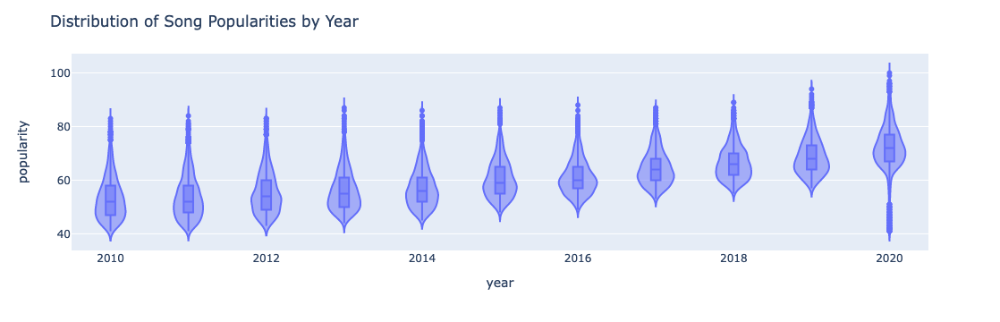

In [22]:
# Popularity per year
more_40 = df[df["popularity"] > 40]
fig = px.violin(more_40, y="popularity", x="year", box=True, hover_data=df.columns)
fig.update_layout(title_text="Distribution of Song Popularities by Year")
fig.show()

The above graph is a violin plot displaying the distributions in popularity of each song in our dataset, by year. Since the dataset extremely rarely includes songs with popularities below 40, the axis for popularity begins at 40. As the data shows, the popularity metric is definitely sensitive to year, rising consistenly each year. This is to be expected, as Spotify stated that their popularity metric considers how recent a song's plays. The variation on the songs, however, is fairly similar year-to-year, with a median fairly low, similarly sized quartile ranges, and a skew to higher popularity values. This makes sense, as often most songs are less popular, with a few outlying very popular songs. The only difference is 2020, which is much more symmetric, and has outlying unpopular songs. This may be due to how the data is collected: it is possible that the dataset gathered songs from a Spotify API listing that included both music from the past that has been popular to some degree, as well as fresh music released within the past year regardless of popularity. 

As the violin plots show that the age of a song has a strong impact on popularity, distributions of popularity scores throughout the year can confirm the conclusions described earlier. 

The static image is embedded below.

![a violin plot](https://github.com/ElijahCGames/DataFinalReport/blob/main/Violin.png?raw=true)

In [24]:
import chart_studio
# Add histogram data for every 2 years, 
# restricting by days and popularity (negligible amount of songs under 12 popularity)
one = df[(df.days_since >= 0) & (df.days_since <= 730) & (df.popularity >= 12)]
two = df[(df.days_since > 730) & (df.days_since <= 1460) & (df.popularity >= 12)]
three = df[(df.days_since > 1460) & (df.days_since <= 2190) & (df.popularity >= 12)]
four = df[(df.days_since > 2190) & (df.days_since <= 2920) & (df.popularity >= 12)]
five = df[(df.days_since > 2920) & (df.days_since <= 3650) & (df.popularity >= 12)]

# Group data together
hist_data = [one["popularity"], two["popularity"], three["popularity"], four["popularity"], five["popularity"]]
group_labels = ['2010-2012', '2012-2014', '2014-2016', '2016-2018', '2018-2020']

# Create distplot and set title
fig = ff.create_distplot(hist_data, group_labels, bin_size=1, show_rug=False)
fig.update_layout(title_text="Distribution of Song Popularities Throughout The Decade")
fig.update_xaxes(title='Popularity')
fig.show()

username = 'arezab213' 
api_key = '0anCcJnzdFaJ0dofY2QR' 

chart_studio.tools.set_credentials_file(username=username, api_key=api_key)
import chart_studio.plotly as py
py.plot(fig, filename = 'popularity_distribution', auto_open=True)

'https://plotly.com/~arezab213/1/'

The distribution plot above depicts the distributions of popularities throughout the year. All the distributions are unimodal, indicating that in general, both very low and very high popularity scores occur less frequently. Instead, scores appear most often around one center. Again, we see that the more recent the grouping is, the more popular its songs tend to be. Additionally, the distributions are consistently skewed heavily to the right, reflecting the same trend depicted in the violin plots. However, the variation for each group seemingly increases with its age. More recent groupings have higher peaks, indicating that its data is more centralized and thus has a lower variation. The difference in variation may be attributed to the fact that hit songs from the past decrease in the amount of recent plays at different rates over time, leaving a wider range of current popularity values. 2016-2018's distribution appears to have a lower variation than the 2018-2020 distribution. As seen in the prior violin plots, this is likely due to the dataset including 2020 songs with noticeably lower popularities.

From the two depicted visuals so far, Spotify's incorporation of how recent a song's plays in determining its popularity is clearly reflected. However, the popularity metric can be better understood when also evaluating the total amount of streams a song has, which is the second involved in Spotify's popularity metric.

The static image is embedded below.

![Distribution through the 2010s](https://github.com/ElijahCGames/DataFinalReport/blob/main/histograms.png?raw=true)

In [25]:
top100['Year Released'] = pd.DatetimeIndex(top100['Date published']).year
# Include only past 10 years. Almost all the songs are post-2010
t100 = top100[top100['Year Released'] >= 2010]
fig = px.scatter_3d(t100, x='Year Released', y='Streams(Millions)', z='Popularity', color='Rank', opacity=1, hover_name="Song",color_continuous_scale=px.colors.sequential.algae,hover_data=["Artist(s)"])
# tight layout
fig.update_layout(margin=dict(l=20, r=20, b=20, t=0), title_text = "Year vs. Total Streams vs. Popularity in the Top 100", title_y = .95)
fig.show()
# plotly image would show two images, one with the year released axis in front and one with the streams in millions

username = 'arezab213' 
api_key = '0anCcJnzdFaJ0dofY2QR' 

chart_studio.tools.set_credentials_file(username=username, api_key=api_key)
import chart_studio.plotly as py
py.plot(fig, filename = 'popularity_distribution', auto_open=True)

'https://plotly.com/~arezab213/1/'

Using the dataset with the top 100 songs, a 3D scatter plot can be used to see the popularity scores at 2 values: the year released, and the amount of streams. To also consider the actual ranking in the top 100 list, a color scale reflects the rank, with higher ranking songs having lighter shades, and lower ranking songs having darker shades. 

First, when orienting the scatter plot to show the "Year Released" axis in front, it again can be seen that more recent songs tend to be more popular. Predictably, the more popular the song is, the higher its ranking.

However, when the axis showing total streams is in front, the effect on popularity is less pronounced. The majority of the songs cluster within a lower range of values along the axis, and they all appear more or less randomly distributed in terms of popularity values. Even when observing the few songs with considerably more streams than the majority of the collection, the corresponding popularity score is not discernibly higher than the rest. Interestingly, however, the amount of streams does seem to have a clear correlation to ranking. The colors of the points have a very consistent trend of darkening as the streams increase, showing that song ranking improves as total streams increases.

From these observations, important inferences can be made. The sensitivity the popularity metric has shown to the release year of the song proves that it is a very time-based variable. Overall success, however, which appears to be the determining factor of a song's rank, places a much heavier emphasis on total plays.

The static images of the persepectives are embedded below.

![link text](https://github.com/ElijahCGames/DataFinalReport/blob/main/newplot%20(4).png?raw=true)
![link text](https://github.com/ElijahCGames/DataFinalReport/blob/main/3d.png?raw=true)
![link text](https://github.com/ElijahCGames/DataFinalReport/blob/main/newplot%20(5).png?raw=true)


In [25]:
# Select 8 of the more important features
features_to_view = ["duration_ms","acousticness","energy","instrumentalness","days_since",'speechiness','danceability','tempo']
# Make 2 rows and 4 columns for reduced space, make the y-axis shared
fig = make_subplots(rows=2, cols=4, start_cell="bottom-left",subplot_titles=features_to_view, horizontal_spacing = 0.05, vertical_spacing = 0.15, shared_yaxes = True)
# Use a random fraction of the main dataset for easier processing
small_df = df.sample(frac = .04)
small_df = small_df[small_df["popularity"] > 20]
small_df = small_df[small_df["duration_ms"] < 1000000]
y = small_df["popularity"]
# Initialize row / column index
col_index = 1
row_index = 1
for i,feat in enumerate(features_to_view):   
    # reset column index when the 5th feature is reached, make the row index 2
    if (i == 4):
        row_index = 2
        col_index = 1
    x = small_df[feat]
    fig.add_trace(go.Scatter(x=x,y=y,mode="markers"), row=row_index, col=col_index) 
    col_index += 1
    
# Adjust height and width
fig.update_layout(height=680, width = 1000, title = "Features vs. Popularity", showlegend=False)
fig.show()

Now, we begin to assess the various features involved in the project. Shown above, eight features of a sampling of songs are plotted against popularity, showing some preliminary trends in our data. Ultimately, we will use these features to predict popularity, so seeing if there is a relationship is very important. The scatter plots can also show distributions of the feature.

As expected, the amount of days since 2010 clearly positively correlates to popularity. Discernible negative correlations, although seemingly weak, can be found in the plots for intstrumentalness and speechiness. This is a reasonable finding, as it is exceptionally rare for popular songs to be highly instrumental or not very musical. Exclusively speech-like tracks, such as audiobooks or podcasts, do not appeal to the masses nearly as much as music, which is why the x-axis in the scatterplot for speechiness does not even go beyond .7, which is around when tracks are no longer considered as songs. Songs with instrumentalness values higher than .5 represent more instrumental songs with less vocals. Very popular songs seemingly tend to always incorporate established vocals. Interestingly, when the value approaches 1, the negative trend seems to end and popularity again increases. It can be inferred that a song should either have established vocals or none at all in order to gain a high popularity. 

An interesting feature to observe is acousticness, as it appears to follow a similar trend to instrumentalness. The value of .5 seems to be quite a definitive transition point where the negative correlation seems to turn slightly positive. Similarly, it can be inferred that in order to have a high popularity, songs should commit to using either only acoustic instruments, or none.

For the rest of the features, correlations appear to be weaker. Both danceability and energy seem to have slight positive correlations, which follows the assumption that most hit songs likely provide upbeat and energizing experiences to listeners. Of the remaining features, duration_ms and tempo, there seems to be close to no correlation.

Regarding the distribution of each feature's values, there are multiple important takeaways. In days_since, the dataset's incorporation of low popularity but very recent music is reflected in the dip portrayed in the graph. Danceability, tempo, energy, and duration_ms all seem to be very centralized to a value somewhere in the middle of their corresponding ranges, while acousticness, speechiness, and instrumentalness appear to cluster at the very low end of their ranges.

The static image is embedded below. 

![link text](https://github.com/ElijahCGames/DataFinalReport/blob/main/newplot%20(2).png?raw=true)

In [26]:
# Use random fraction of dataset for easier processing
small_df = df.sample(frac = .2)
# Since nearly all the durations lie under this value, exclude those that do not to have a better used axis
small_df = small_df[small_df["duration_ms"] < 1000000]
fig = px.scatter_matrix(small_df, dimensions=["duration_ms","acousticness","energy","instrumentalness"],
    # Add color to represent how new a song is
    color="days_since",
    color_continuous_scale=px.colors.sequential.Viridis,
    title="Major Features Comparison"
    )
# Adjust height
fig.update_layout(height=580, title = "Major Feature Relationships")
fig.show()

To learn more about the relationships only between features, the above plots show a few of the most important features plotted against each other in a scatterplot, colored by how long it has been since their release. Many of these plots (of course, with the exception of the variables plotted against themselves), show very little correlation between the variables, a good thing. This means that at least the more effectual features are closer to independent, and we can thus use them effectively in our machine learning models. The one noticeably dependent relationship is between energy and acousticness, which appears to be negative and weak. The yellow shapes in these models also show trends for recent music; they show what kinds of ratios of these features are popular in recent music. For example, the yellow marks to the left of all the instrumentalness plots show that many songs being released in the last year or so are very low on the instrumentalness scale, an interesting observation.

The static image is embedded below. 

![link text](https://github.com/ElijahCGames/DataFinalReport/blob/main/newplot(2).png?raw=true)

In [27]:
# I think the class hasnt talked about heatmaps, so I mostly just included this in case the earlier visualizations
# don't give the extra credit. it shows the correlations between each feature as well as popularity
corr = df[['acousticness','danceability', 'days_since','energy','loudness', 'popularity','speechiness','tempo','valence']].corr()
plt.figure(figsize=(13,8))
plt.subplots_adjust(bottom=0.1)
#sns.heatmap(corr, annot=True, cmap=plt.get_cmap("magma"), center = 0)

<Figure size 936x576 with 0 Axes>

### 3.3. Model Construction and Hypothesis Testing

In [28]:
# Section imports
from scipy import stats
# Regression estimators
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import LinearSVR
from sklearn.metrics import r2_score
# Classification estimators
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC

In this section, both the regression and classification models are constructed, with basic evaluations on performance done on both the training and test sets. This is done to get a sense of which algorithm shows the most promise, to be later optimized for maximum performance. After the models are constructed and briefly evaluated, our hypothesis test is run on each feature, with a full report of the result also printed. In the next section, the performances of our models will be reported in more detail.

#### 3.3.1 Model Construction

**Regression Model**

First, a dictionary containing the estimators for each regression algorithmn being used is created.

In [29]:
models = {
    'Linear Regression': LinearRegression(),
    'Support Vector Machine': LinearSVR(max_iter=1e5, random_state=1234),
    'Ridge regression': Ridge(random_state=1234),
    'Lasso regression': Lasso(random_state=1234),
    'k-Nearest Neighbor': KNeighborsRegressor()}

Then, each estimator is fit with the training data. A dictionary of the trained models is also created for future evaluation.

In [30]:
# Dictionary defined for future evaluation
trained_models = {}

# Iterate through the regression models
for key in models.keys():
    model = models[key]
    # Train the model
    model.fit(X_train_selected, y_train)
    # Print the performance of the model in both training and testing sets
    print(key + '\'s training set score : ' + format(r2_score(y_train, model.predict(X_train_selected)), ".4f"))
    print(key + '\'s testing set score : ' + format(r2_score(y_test, model.predict(X_test_selected)), ".4f"), end='\n\n')
    trained_models[key] = model

Linear Regression's training set score : 0.1809
Linear Regression's testing set score : 0.1509

Support Vector Machine's training set score : 0.1001
Support Vector Machine's testing set score : 0.0735

Ridge regression's training set score : 0.1806
Ridge regression's testing set score : 0.1528

Lasso regression's training set score : 0.0449
Lasso regression's testing set score : 0.0397

k-Nearest Neighbor's training set score : 0.5067
k-Nearest Neighbor's testing set score : 0.2119



**Classification Model**

The above process is then replicated to create the classification models, using the sets created for classification:

In [31]:
models_c = {
    'k-Nearest Neighbor': KNeighborsClassifier(), 
    'Support Vector Machine': LinearSVC(max_iter=1000000), 
    'Decision Tree': DecisionTreeClassifier()} 

In [32]:
# Dictionary defined for future evaluation
trained_models_c = {}

# Iterate through the regression models
for key in models_c.keys():
    model = models_c[key]
    # Train the model
    model.fit(X_train_selected_c, y_train_c)
    # Print the performance of the model in both training and testing sets
    test_accuracy = model.score(X_test_selected_c, y_test_c)
    train_accuracy = model.score(X_train_selected_c, y_train_c)
    print(key + '\'s training set score : ' + format(train_accuracy*100, ".2f")+ "%")
    print(key + '\'s testing set score : ' + format(test_accuracy*100, ".2f") + "%", end='\n\n')
    trained_models_c[key] = model

k-Nearest Neighbor's training set score : 83.92%
k-Nearest Neighbor's testing set score : 76.21%

Support Vector Machine's training set score : 79.39%
Support Vector Machine's testing set score : 78.43%

Decision Tree's training set score : 99.80%
Decision Tree's testing set score : 72.57%



#### 3.3.2 Hypothesis Tests

Our hypothesis test is then run on each feature, with a report of the results printed.

In [33]:
#It is important to note that the following is observational, not experimental, meaning that we can NOT conclude causation from any significant results.
features.columns
print("On each feature, a significance test was conducted at the 0.05 alpha level to determine whether a linear")
print("relationship exists between it and the popularity metric. A non-zero correlation coefficient suggests that a") 
print("linear relationship exists.\n\n")
for feature in features.columns:
    small_df = df.sample(frac = .25)
    feat = small_df[feature]
    pop = small_df["popularity"]
    print(feature + ":")
    print("H_0: There is no linear correlation between the "+feature+" feature and popularity.")
    print("H_A: There is a nonzero linear correlation between "+feature+" feature and popularity.\n")
    r, pvalue = stats.pearsonr(feat, pop)
    print("The p-value for this test is "+str(pvalue))
    print("Since "+str(pvalue)+" ", end="")
    if (pvalue > 0.05):
        print("> 0.05, we can not reject the null hypothesis, and there may be no correlation between "+feature+" and popularity.")
        if(not (selection[feature][0])):
            print("This is good news, as our feature selector chose to eliminate "+feature+" from consideration in our machine learning models.")
    else:
        print("< 0.05, we have sufficient evidence to reject the null hypothesis and conclude there") 
        print("is a correlation between "+feature+" and popularity.")
        if(selection[feature][0]):
            print("This is good news, as our feature selector identified "+ feature + " as important for our machine learning models.")
    print("\n")

On each feature, a significance test was conducted at the 0.05 alpha level to determine whether a linear
relationship exists between it and the popularity metric. A non-zero correlation coefficient suggests that a
linear relationship exists.


valence:
H_0: There is no linear correlation between the valence feature and popularity.
H_A: There is a nonzero linear correlation between valence feature and popularity.

The p-value for this test is 0.004887365913290113
Since 0.004887365913290113 < 0.05, we have sufficient evidence to reject the null hypothesis and conclude there
is a correlation between valence and popularity.
This is good news, as our feature selector identified valence as important for our machine learning models.


acousticness:
H_0: There is no linear correlation between the acousticness feature and popularity.
H_A: There is a nonzero linear correlation between acousticness feature and popularity.

The p-value for this test is 0.3196433121715887
Since 0.3196433121715887 >

### 3.4. Model Evaluations

In [34]:
# Section imports
from scipy import stats
from sklearn.model_selection import cross_val_score

When evaluating the model performances, the mean of the cross validation scores is used. In cross validation, multiple performances are evaluated. The data is divided into K sections, with one section being used as the test set while all other sections are used for training. The model is trained and tested K times, with a new testing set each time. This ensures that the evaluated performances for each model are not dependent on the variation of solely one test set, giving a better representation of the overall performance of the model.

#### 3.4.1 Regression Model Evaluations

Cross validation testing with 5 folds was done on the regression models, with the results printed below.

In [35]:
# Iterate through trained regression models
for key in trained_models.keys():
    # Evaluate five performances
    cv_scores = cross_val_score(trained_models[key], X_train_selected, y_train, cv=5)
    print("Cross-validation scores for "+key+":")
    for score in cv_scores:
        print("\t"+format(score, ".4f"))
    print("Mean score: " + format(np.mean(np.array(cv_scores)), ".4f"))
    print('\n')

Cross-validation scores for Linear Regression:
	0.1833
	0.1971
	0.1815
	0.1651
	0.1640
Mean score: 0.1782


Cross-validation scores for Support Vector Machine:
	0.1051
	0.0974
	0.1152
	0.0953
	0.0830
Mean score: 0.0992


Cross-validation scores for Ridge regression:
	0.1820
	0.1956
	0.1842
	0.1699
	0.1613
Mean score: 0.1786


Cross-validation scores for Lasso regression:
	0.0443
	0.0457
	0.0486
	0.0453
	0.0410
Mean score: 0.0450


Cross-validation scores for k-Nearest Neighbor:
	0.2205
	0.2943
	0.2025
	0.2543
	0.2275
Mean score: 0.2398




For regression algorithms, performance is represented by the r2 score, a value from 0 to 1, that represents the proportion of the variation in the data that can be explained by the regression model. For instance, an r2 value of 0.9 for a regression model using Ridge indicates that 90% of the variation in the data can be explained by the model, so it is very effective at closely replicating observed outcomes using its linear regression approximation. Lower r2 values indicate that a smaller portion of the variation in the data can be accounted for, so the model's linear approximations may vary significantly compared to the observed outcomes.

The performances of the regression models were low, with no r2 value exceeding .25. The highest performing model used the k-Nearest Neighbor algorithm, with an average r2 value of 0.2398. Next, the Linear Regression and Ridge models performed very closely, with r2 values of 0.1782 and 0.1786, respectively. The bottom two performing algorithms were Support Vector Machine and Lasso, with respective mean performances of 0.0992 and 0.0450.

From the printed results in the previous section, there was only one strong suggestion of overfitting. In our highest performer, the k-Nearest Neighbor model, the performance on the training set was 0.5067 while the test set performance was .2119.

#### 3.4.2 Classification Model Evaluations

Cross validation testing with 5 folds was also done on the classification models, with the results printed below.

In [39]:
# Iterate through trained classification models
for key in trained_models_c.keys():
    # Evaluate five performances
    cv_scores = cross_val_score(trained_models_c[key], X_train_selected_c, y_train_c, cv=5)
    print("Cross-validation scores for "+key+":")
    for score in cv_scores:
        print("\t"+format(score * 100, ".2f") + "%")
    print("Mean score: " + format(np.mean(np.array(cv_scores)) * 100, ".2f") + "%")
    print('\n')

Cross-validation scores for k-Nearest Neighbor:
	76.25%
	76.49%
	77.59%
	76.51%
	77.40%
Mean score: 76.85%


Cross-validation scores for Support Vector Machine:
	79.12%
	78.63%
	79.82%
	79.05%
	80.31%
Mean score: 79.39%


Cross-validation scores for Decision Tree:
	72.39%
	71.78%
	73.16%
	73.52%
	73.67%
Mean score: 72.90%




For classification algorithms, performance is measured by accuracy, which is simply the proportion of correct predictions (i.e. classifications) over the total number of predictions. Here, the proportion is represented by percents, and represents the rate at which each model correctly identified whether or not a song will have a popularity at or above the 75th percentile.

Being that it only has two possible outcomes to predict, binary classification is much more simple than regression estimates. As a result, the classification performances are higher than the regression performances, with accuracies around 75%. The highest performer used Support Vector Machine as its classifier, and was 79.39% accurate. Next was the k-Nearest Neighbors classification model, which performed at 76.85% average accuracy. The lowest mean accuracy was the Decision Tree Model, scoring at 72.92%.

The previous section indicates that there may be moderate overfitting with the k-Nearest Neighbors classification model, with a training performance of 83.92% and a test performance of 76.21%. There is a very strong suggestion of overfitting in the Decision Tree classifier, with a training performance of 99.80% and a test performance of 72.96%.

### 3.5. Model Optimization

In [40]:
# Section imports
from sklearn.model_selection import GridSearchCV

As both our regression and classification models indicated strong signs of overfitting, an oppurtinity to optimize model performance arises. As our k-Nearest Neighbors regressor and Support Vector Machine classifier showed the highest performances in their respective groups, hyperparameter tuning can be used to mitigate their differences in training and test set performances, while also potentially boosting overall performance.

#### 3.5.1 Regression Optimization

When tuning the k-Nearest Neighbor regressor, GridSearch is used to evaluate the best combination of parameters that will lead to high overall performance. For k-Nearest Neighbors, the parametes involved are the number of neighbors to be considered, as well as whether or not a weight is placed on the importance of a neighbor based on its distance to the data point. We used a series of numbers as possible parameters for the number of neighbors. For weight, we used uniform or distance based weighing systems as potential parameters.

In [41]:
# Extract highest performer
model = models['k-Nearest Neighbor']
# Input parameter options
hyperparameters = {'weights': ['uniform', 'distance'], 'n_neighbors': [1, 3, 5, 10, 15]}
# Test combinations using GridSearch
gridsearch = GridSearchCV(model, hyperparameters, cv = 5)
gridsearch.fit(X_train_selected, y_train)
# Output best results
print("Selected parameters are "+str(gridsearch.best_params_))

Selected parameters are {'n_neighbors': 15, 'weights': 'distance'}


The best combination of parameters for our k-Nearest Neighbors regressor is a distance based weighing of neighbors, with 15 neighbors being considered.

#### 3.5.2 Classification Optimization

The same process described above was done for our Support Vector Machine classifier. Here, the parameter to tune is C, the regularization. Regularization determines the tolerance involved in allowing miss-classifications in the vector space. A high C means a low tolerance for allowing miss-classifications, therefore lowering C will aid in resolving overfitting. We used a series of numbers both below and above 1 for the GridSearch to assess.

In [42]:
# Extract highest performer
model = models_c['Support Vector Machine']
# Input parameter options
hyperparameters = {'C': [0.1, 0.3, 0.5, 0.7, 1, 5, 10]}
# Test combinations using GridSearch
gridsearch_c = GridSearchCV(model, hyperparameters, cv = 5)
gridsearch_c.fit(X_train_selected_c, y_train_c)
# Output best results
print("Selected parameters are "+str(gridsearch_c.best_params_))

Selected parameters are {'C': 0.7}


A regularization of .7 was determined to be the optimal C value for our SVM classifier.

### 3.6. Model Testing

With the two models now tuned, we test them and print their cross-validated training set scores, and more importantly, their performance on the test set.

In [43]:
# Regressor tested
print("With these parameters, the optimized regression cross-validated performance is: "+ format(gridsearch.best_score_, ".4f"))
print("meanwhile, the optimized test set performance is: "+format(gridsearch.score(X_test_selected, y_test), ".4f"))

With these parameters, the optimized regression cross-validated performance is: 0.3187
meanwhile, the optimized test set performance is: 0.3088


In [44]:
# Classifier tested
print("With these parameters, the optimized classification cross-validated performance is: "+ format(gridsearch_c.best_score_ * 100, ".2f") + "%")
print("meanwhile, the optimized test set performance is: "+format(gridsearch_c.score(X_test_selected_c, y_test_c) * 100, ".2f") + "%")

With these parameters, the optimized classification cross-validated performance is: 79.40%
meanwhile, the optimized test set performance is: 78.43%


<a id="4"></a>
<hr style="height:2px; border:none; color:black; background-color:black;">

## 4. DISCUSSION

**Summary of Analysis**

To answer our previously raised questions, we began with acquiring a data set that adequately provided information about a surplus of songs, with credible Spotify-sourced data backing each song. Using a top 100 listing of songs, we scraped the data to create another dataset that represented a smaller collection of songs, but this time with total streams as a variable in addition to popularity. After some data wrangling, we had a dataset that had filtered out the unnecessary information and transformed some of the remaining data to a more accessible form. This was when we established our initial feature set, as well as the target outcomes for both of our model types (numerical target for regression, binary categorical for classification).

Once the main dataset had been properly processed and the feature and targets were defined, we created our training and testing sets for both of our model types. From there, we scaled both sets using MinMaxScaler so that the continuous features were standardized. Lastly, the sets were also then subsequently filtered so that only the most important features were considered. Now, the process of creating and processing the training and testing sets for our models was finalized.

We then visualized our data to gain a deeper understanding of it. Initially, we used violin plots and distribution plots to get a sense of the trends of song popularities throughout the years, and saw that popularity was heavily influenced by how recent a song was. We then used the top100 dataset to assess the roles that release year and total streams have on popularity, and found that overall song success greatly correlated with total streams, while popularity is a much more time-sensitive metric. Next, we plotted each feature against popularity to determine the existence of any relationships. It was evident that only the days_since feature indicated a strong correlation, but other much weaker correlations in a few other features were noticeable. Lastly, to see any existence of relationships the more important features had with each other, we used a scatter matrix. It appeared that these major features were largely independent, with the exception of acousticness and energy.

We then tested our hypothesis on each feature, determining whether a linear correlation to popularity existed. The majority of the results were supported by our feature selector, which kept the 10 most important features. Statistically significant p-values for a feature indicated that the correlation coefficient likely deviating enough from 0, meaning that a linear relationship does seem exist to some extent.

To best answer the questions, we created both regression and classificaiton models. For our regression models, we compared the LinearRegression, Ridge, Lasso, K-nearest Neighbors, and LinearSVR algorithms. For the classification models, we compared the Decision Tree, K-nearest Neighbors, and LinearSVC algorithms. After cross-validation, we optimized the highest performing models by using GridSearch to tune their respective parameters. The performance of LinearSVC was unchanged even after optimization, likely meaning that the default parameter was close enough to its optimal value, making any improvement tuning caused be largely negligible.

**Interpretation of Findings**

On the test set, the best regression model (K-nearest Neighbors) had an r2 of .3088, and the best classification model (LinearSVC) had an accuracy of 78.43%. 

The low performance shown by our KNN regressor can likely be attributed to the variation present within our data. The r2 value itself, .3088, means that around 30% of the variation present in the dataset can be explained by our regressor. The KNN regression algorithm works by averaging the target values of the surrounding neighbors of a data point as its prediction. When there is high variation in the relationship between the features and target value, as was the case here, it means that the features are not strong enough predictors for a regression algorithm to use reliably. The low correlation between the majority of the features of a song and its popularity causes the distribution of the surrounding data points (the neighbors) to have highly varying levels of popularity. As a result, a regression estimate in this case is limited in how close it can be to the observed outcome, since high variation makes it possible for the predicted outcome to lie far away from the actual value. From this, we can conclude that for our tested algorithms, precise predictions of song popularity can not be consistently made using release date, duration, and audio-based characteristics as features. This is similar to the results of Pachet and Roy's experiment [5], as it seems like the current features are not the greatest predictors for precise popularity values. This makes sense, as mainstream approval of a song is much more dependent on more social variables such as artist fame and the extent of media exposure, making it difficult to use quantitative musical characteristics as useful features.

Although this means that our regression system can not be used to predict the popularity of music, it does mean that the scope of musical creativity doesn't have to be restricted based on which styles of music are most popular. 

As the binary classification model worked much more simply, it predictably yielded a higher performance, with the SVC model being 78.43% accurate in classifying the test set. This means that around 80% of the time, the model correctly predicted whether or not a song would be in the top 25% of popularity. This component of the project was similar to Koenigstein, Shavitt, Zilberman's work [4], where they used binary classification to predict a high Billboard ranking at an accuracy of 73.5%. Aside from its less complex method of prediction, another factor that may contribute to a higher performance in our classifier is the possibility that songs with very high popularity values tend to have less variation. This was seen to some degree with  the scatter matrix: the portion of the plots that showed above the 75th percentile for popularity reasonably had a smaller portion of the distribution, but more importantly, in some features that smaller portion had less of a spread than the entire plot. A reduced variation in the features of the top 25 percent of songs means that they can be better predictors for popularity than features of songs that are less popular. Therefore, this likely bolstered the performance of our classifier. 

**Conclusion**

Our findings seemed to closely reflect the referenced past studies. Using our features, to make a predictive model have a high performance, we had to greatly reduce the standard of precision to binary classification. Thus, it can be said that the audio-based features of a song as well as its duration and release date work as relatively good predictors for determining top percentile placement in popularity value. For more precise estimates of numerical outcomes, regression algorithms are conventionally the correct decision, but evidently, the high variation and weak correlation many of our features had to the popularity metric made for a low performing regressor.

For future work, it may be helpful to acquire a similar expansive dataset of songs, but instead of audio-based features, variables pertaining to the social characteristics of a song could be used. The issue with this, however, is that it is quite difficult to quantify or categorize such measurements in a standard way. To reduce the influence time-based features have on the outcome variable, redefining the outcome variable to a less dynamic variable, such as changing the target from popularity to total streams, may potentially help in increasing the correlation of the features. As seen in our data, we had one feature, days_since, that was disproportionately more effectual than the rest.

#### References
[1] Ay, Y. (2020, November 25). Spotify Dataset 1921-2020, 160k+ Tracks. Retrieved December 08, 2020, from https://www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks

[2] Get Audio Features for a Track. (n.d.). Retrieved December 08, 2020, from https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/

[3] IFPI issues annual Global Music Report. (2020, August 03). Retrieved December 08, 2020, from https://www.ifpi.org/ifpi-issues-annual-global-music-report/

[4] Koenigstein, Noam & Shavitt, Yuval & Zilberman, Noa. (2009). Predicting Billboard Success Using Data-Mining in P2P Networks. ISM 2009 - 11th IEEE International Symposium on Multimedia. 465-470. 10.1109/ISM.2009.73. 

[5] Pachet, Francois & Roy, Pierre. (2008). Hit Song Science Is Not Yet a Science.. 355-360. 

[6] Salganik, Matthew J., Peter Sheridan Dodds, and Duncan J. Watts.
”Experimental study of inequality and unpredictability in an artificial
cultural market.” science 311.5762 (2006): 854-856.

[7] https://en.wikipedia.org/wiki/List_of_most-streamed_songs_on_Spotify

<a id="5"></a>
<hr style="height:2px; border:none; color:black; background-color:black;">